# Import Library & Set Globals

In [5]:
%load_ext jupyter_black

# base
import os
import sys
import warnings
import logging
import pickle

# data manipulation
import pickle
import pandas as pd
import itables
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# single cell
import scanpy as sc
import decoupler as dc
import gseapy as gp

itables.init_notebook_mode(connected=True)  # Use connected=False for offline use
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", pd.errors.DtypeWarning)
warnings.simplefilter("ignore", pd.errors.PerformanceWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# custom
from single_cell.R import *
from single_cell.preprocess import *
from single_cell.plot import *
from single_cell.analysis import *
from spatial_seq.plot import *
from utils import *

converter = get_converter()

# R_preload()
%load_ext rpy2.ipython

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [6]:
%matplotlib inline
study = "paper_processed_FULL"
R_converted = False

CORES = 10
DATADIR = "../../../data"
REFDIR = "../../../references"
DOUBLETMETHODS = ["scDblFinder", "DoubletFinder", "doubletdetection", "scrublet"]

# Get all data

In [ ]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated_leiden1"
savedir = os.path.join(DATADIR, "processed", study, "py", "3_annotated")
adata = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# order categories
order_obs(
    adata,
    "Identifier",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(
    adata,
    "Groups",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(adata, "Experiment", ["GSM7747185", "GSM7747186", "GSM7747187", "GSM7747188"])
order_obs(adata, "Condition", ["LFD", "HFD"])
order_obs(adata, "Sample Type", ["eWAT", "iWAT"])

In [ ]:
# # save
# annotation = "manDoublet-seuratV3-harmony-annotated_leiden1"
# savedir = os.path.join(DATADIR,'processed',study,'py', '3_annotated')
# adata.write(os.path.join(savedir,f'{annotation}.h5ad'))

# Fibroblast prep

### Subset

In [ ]:
# subset
adata_fibros = adata[adata.obs["cell_type"] == "Fibroblast"].copy()
del adata_fibros.uns, adata_fibros.varm, adata_fibros.obsp
sc.pp.filter_cells(adata_fibros, min_genes=200)
sc.pp.filter_genes(adata_fibros, min_cells=5)
Visualize(adata_fibros, "_fibro")

In [ ]:
# integration check
f = plt.figure(figsize=(18, 12), layout="constrained")
check_integration(
    adata_fibros,
    "Groups",
    f,
    embeddings=["UMAP_fibro", "LocalMAP_fibro"],
    nrow=2,
    ncol=2,
)

### Clusters

In [ ]:
recluster = False
key = "leiden_fibro"

if recluster is True:
    sc.tl.leiden(adata_fibros, resolution=0.5, key_added=key)
    # order_obs(adata_fibros,"leiden_fibro",pd.Series([2,1,6,0,4,3,7,5]).astype(str))

# figure prep
cluster_c = color_gen(adata_fibros.obs[key]).to_list()
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
embedding = "LocalMAP_fibro"  # "UMAP_fibro" # "LocalMAP_fibro"
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=[key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c,
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_fibros, basis=embedding, color=["Groups"], ax=ax, show=False, alpha=0.7
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_fibros, basis=embedding, color=["Condition"], ax=ax, show=False, alpha=0.7
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_fibros, basis=embedding, color=["Sample Type"], ax=ax, show=False, alpha=0.7
)

# Violin marker plots
markers = ["Pdgfra", "Dpp4", "Cd55", "F3", "Lpl"]
plot_violinplot(adata_fibros, markers, key, sf[1])

In [ ]:
# cluster composition
f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(
    adata_fibros, "Groups", "leiden_fibro", pct=False, ax=axs[0]
)
plot_cluster_stackedbarplot(adata_fibros, "Groups", "leiden_fibro", pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(
    adata_fibros, "leiden_fibro", "Groups", pct=False, ax=axs[0]
)
plot_cluster_stackedbarplot(adata_fibros, "leiden_fibro", "Groups", pct=True, ax=axs[1])

pd.crosstab(adata_fibros.obs["leiden_fibro"], adata_fibros.obs["Groups"])

In [ ]:
# original subclusters
clear_uns(adata_fibros, "leiden_fibro")
sc.tl.rank_genes_groups(
    adata_fibros,
    groupby="leiden_fibro",
    key_added="de_fibro_sub",
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_fibros,
    groupby="leiden_fibro",
    key="de_fibro_sub",
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)
sc.pl.rank_genes_groups_heatmap(
    adata_fibros, key="de_fibro_sub", groupby=["leiden_fibro"], layer="normalized"
)

# Cluster Regrouping

Loading ITables v2.4.4 from the internet... (need help?)


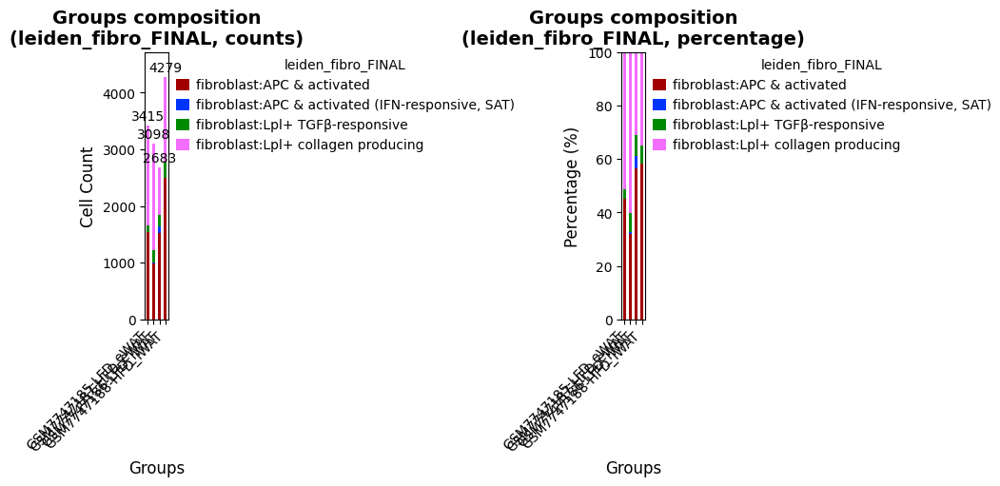

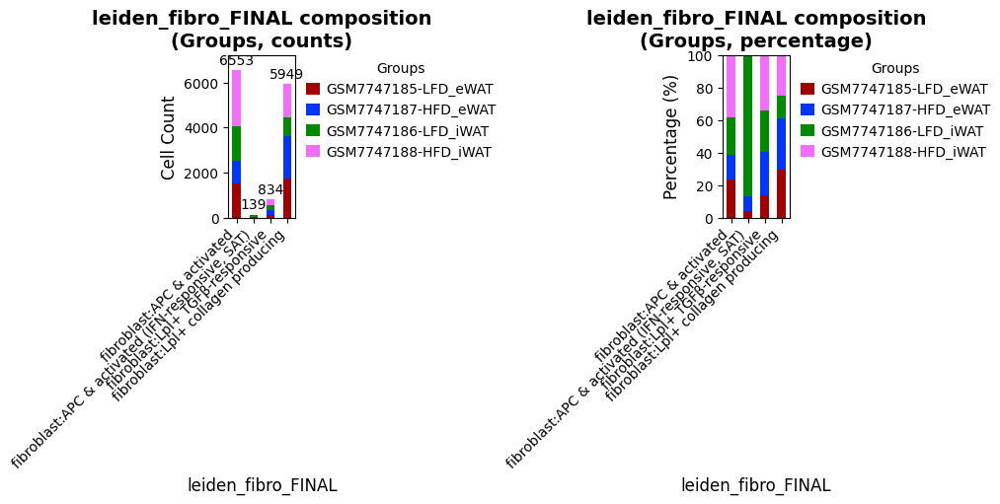

In [ ]:
cluster_key = "leiden_fibro_group"
old_cluster_key = "leiden_fibro"

adata_fibros.obs["leiden_fibro_group"] = (
    adata_fibros.obs["leiden_fibro"]
    .map(
        {
            "1": 1,
            "2": 1,
            "0": 2,
            "3": 2,
            "4": 3,
            "5": 4,
        }
    )
    .astype(str)
)

# reannotate
order_obs(
    adata_fibros,
    cluster_key,
    pd.Series(np.sort(adata_fibros.obs[cluster_key].unique())).astype(str),
)

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_fibros, "Groups", cluster_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_fibros, "Groups", cluster_key, pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_fibros, cluster_key, "Groups", pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_fibros, cluster_key, "Groups", pct=True, ax=axs[1])

pd.crosstab(adata_fibros.obs[cluster_key], adata_fibros.obs["Groups"])

In [ ]:
# grouped vs original subclusters
clear_uns(adata_fibros, "leiden_fibro_group")

# run DEGs
sc.tl.rank_genes_groups(
    adata_fibros,
    groupby="leiden_fibro_group",
    key_added="de_fibro",
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)

# DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(20, 7), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_fibros,
    groupby="leiden_fibro_group",
    key="de_fibro",
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
    show=False,
)

# DEGs violinplot
sc.pl.rank_genes_groups_stacked_violin(
    adata_fibros,
    groupby="leiden_fibro_group",
    key="de_fibro",
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
)


# DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_fibros,
    key="de_fibro",
    groupby=["leiden_fibro"],
    layer="normalized",
    n_genes=50,
)
sc.pl.rank_genes_groups_heatmap(
    adata_fibros, key="de_fibro", groupby=["leiden_fibro_group"], layer="normalized"
)

In [ ]:
# figure prep
key = "leiden_fibro_group"
cluster_c = color_gen(adata_fibros.obs[key]).to_list()
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
embedding = "LocalMAP_fibro"  # "UMAP_fibro"
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=[key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c,
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(adata_fibros, basis=embedding, color=["Groups"], ax=ax, show=False)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(adata_fibros, basis=embedding, color=["Condition"], ax=ax, show=False)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(adata_fibros, basis=embedding, color=["Sample Type"], ax=ax, show=False)

# Violin marker plots
markers = ["Pdgfra", "Dpp4", "Cd55", "F3", "Lpl"]
plot_violinplot(adata_fibros, markers, key, sf[1])

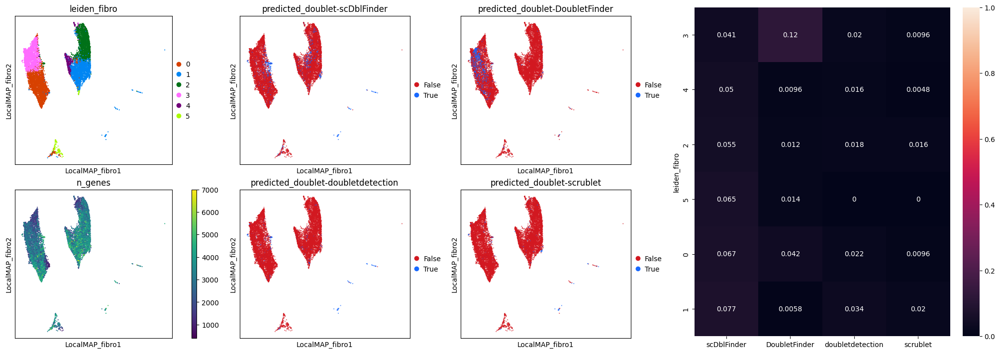

In [83]:
checkDoublets(adata_fibros, "LocalMAP_fibro", "leiden_fibro")

In [ ]:
# relevant subsets
ewat_fibros = adata_fibros[adata_fibros.obs["Sample Type"] == "eWAT"].copy()
ewat_fibros = ewat_fibros[ewat_fibros.obs["leiden_fibro_group"] != "4"].copy()

lfd_ewat_fibros = ewat_fibros[ewat_fibros.obs["Condition"] == "LFD"].copy()
hfd_ewat_fibros = ewat_fibros[ewat_fibros.obs["Condition"] == "HFD"].copy()

In [ ]:
# grouped vs original subclusters
clear_uns(adata_fibros, "leiden_fibro_group")
clean_uns(adata_fibros, "leiden_fibro")

# run DEGs
# sc.tl.rank_genes_groups(
#     adata_fibros,
#     groupby="leiden_fibro_group",
#     key_added="de_fibro",
#     use_raw=False,
#     layer="normalized",
#     method="wilcoxon",
# )

# DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(20, 7), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_fibros,
    groupby="leiden_fibro_group",
    key="de_fibro",
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
    show=False,
)

# DEGs violinplot
sc.pl.rank_genes_groups_stacked_violin(
    adata_fibros,
    groupby="leiden_fibro_group",
    key="de_fibro",
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
)


# DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_fibros,
    key="de_fibro",
    groupby=["leiden_fibro"],
    layer="normalized",
    n_genes=50,
)
sc.pl.rank_genes_groups_heatmap(
    adata_fibros, key="de_fibro", groupby=["leiden_fibro_group"], layer="normalized"
)

# Dissecting clusters

In [6]:
# define markers
selected_markers = [
    "Pdgfra",
    "Ifitm3",  # Interferon-induced transmembrane protein 3, involved in antiviral defense and upregulated in inflamed/adipose tissues during obesity.
    "S100a4",  # S100 calcium-binding protein A4, marker of fibroblast subtypes, contributes to ECM remodeling and fibrosis in adipose tissue.
    "Il1rl2",  # Interleukin 1 receptor-like 2 (IL-36R), receptor for inflammatory cytokines with emerging roles in adipose fibroblast function.
    "Pi16",  # Peptidase inhibitor 16, marker for fibroblast heterogeneity and progenitor maintenance in adipose tissue.
    "Dlk1",  # Preadipocyte factor 1 (Dlk1), inhibits adipogenesis and maintains preadipocyte populations.
    "Fabp4",  # Fatty acid binding protein 4, involved in lipid metabolism, adipocyte function, and a key adipogenesis regulator.
    "Aqp1",  # Aquaporin 1, water channel expressed in various stromal and vascular cells, supports dynamic adipose tissue remodeling.
    "Dpp4",  # Dipeptidyl peptidase-4 (CD26), adipokine and fibroblast marker, regulates inflammation and is elevated in obesity.
    "Cd55",  # CD55 molecule, regulates complement activation and modulates local inflammation in adipose tissue.
    "F3",  # Coagulation factor III (tissue factor), pro-coagulant expressed by activated fibroblasts in inflamed or fibrotic adipose tissue.
    "Lpl",  # Lipoprotein lipase, essential for triglyceride metabolism and storage during adipose tissue expansion.
    "Cxcl12",  # Chemokine that regulates immune cell migration; may influence macrophage recruitment, immune modulation, and tissue remodeling in adipose tissue fibroblasts.
    "Cthrc1",  # Marker of activated fibroblasts; involved in ECM remodeling and fibrosis, potentially contributing to fibrotic responses in adipose tissue.
    "Postn",  # Encodes periostin, a key marker of activated fibroblasts that regulates extracellular matrix composition and fibrosis in response to tissue stress or injury.
    "Saa3",  # Acute phase protein upregulated during inflammation; involved in local tissue immune responses and inflammatory signaling in adipose tissue.
    "Lcn2",  # Adipokine involved in regulating inflammation and metabolic homeostasis; alleviates adipose tissue inflammation and modulates metabolic gene expression.
    "Scube2",  # Cell surface protein that acts in Sonic Hedgehog signaling and potentially ECM regulation; direct relevance in adipose fibroblasts is less established.
    "Npnt",  # Encodes nephronectin, an extracellular matrix protein possibly involved in cell adhesion and tissue organization; specifics for adipose fibroblasts are not well established.
    "Ces1d",  # Carboxylesterase involved in triglyceride hydrolysis and lipid mobilization in adipose tissue, important for adipocyte lipid metabolism and energy balance.
    "Wnt2",  # Secreted ligand in the WNT signaling pathway; may influence fibroblast activation and adipogenesis through paracrine signaling in adipose tissue.
    "Cxcl13",
]

tgfb_genes = [
    "Il33",
    "Ly6a",
    "Ccl2",
    "Dpp4",  # No response
    "Smad2",
    "Smad3",
    "Smad4",
    "Serpine1",
    "Id1",
    "Id2",
    "Id3",  # Intermediate responsive
    "Fn1",
    "Postn",
    "Cthrc1",
    "Vim",
    "Col1a1",
    "Col1a2",
    "Serpinh1",  # High responsive
]

ifn_genes = [
    "Fasn",
    "Irs1",
    "Insr",  # Repressed
    "Irf3",
    "Irf4",
    "Ifi47",
    "Irf1",
    "Ifitm1",
    "Ifitm2",
    "Ifitm3",  # Induced
]

all_fibro_markers = (
    pd.Series(selected_markers + tgfb_genes + ifn_genes).unique().tolist()
)

Text(0.5, 0.98, 'HFD vs LFD expression by cluster (All FBs)\nCurated IFN-responsive genes')

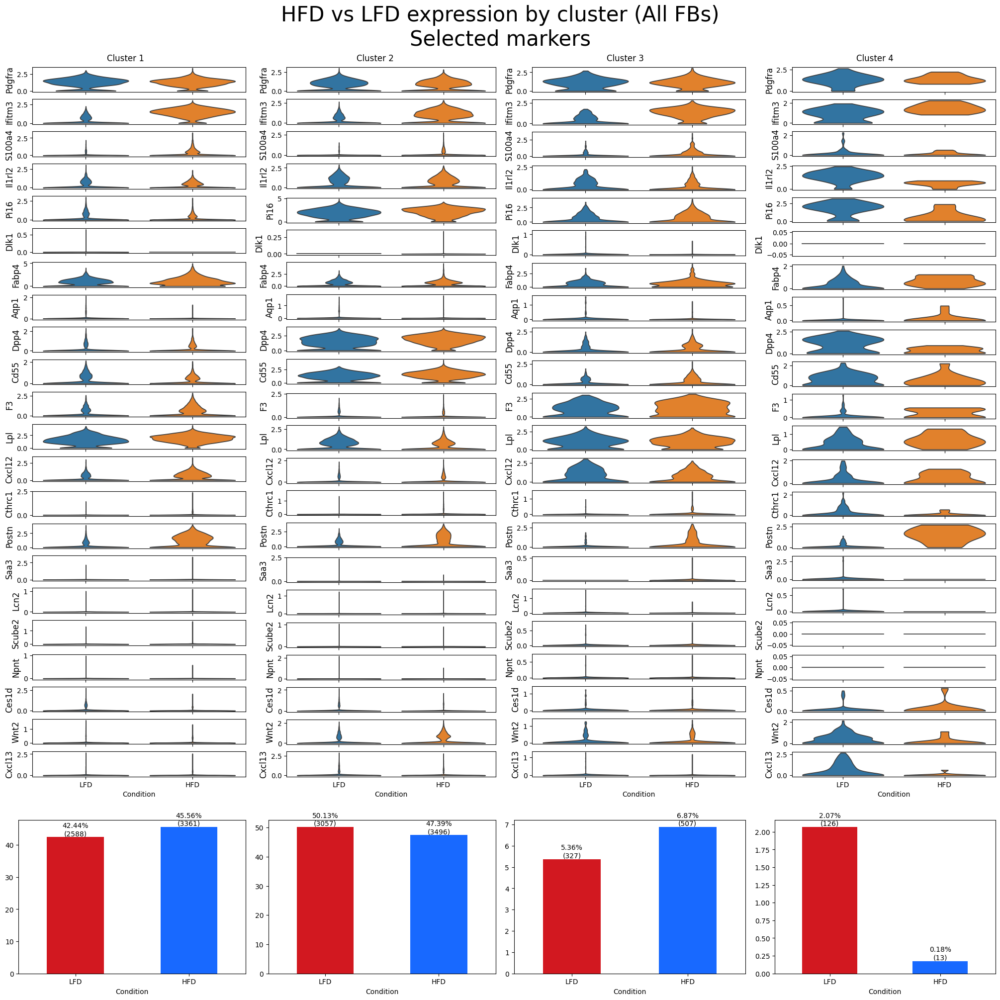

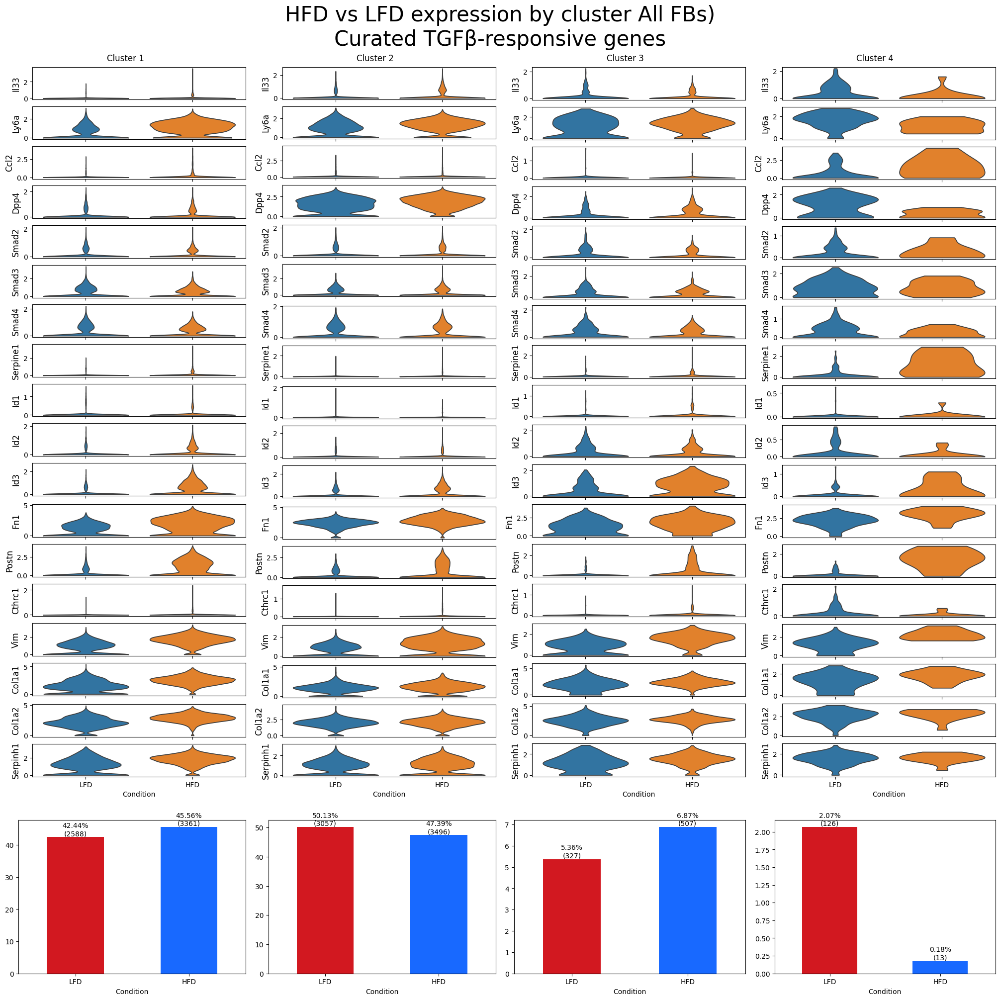

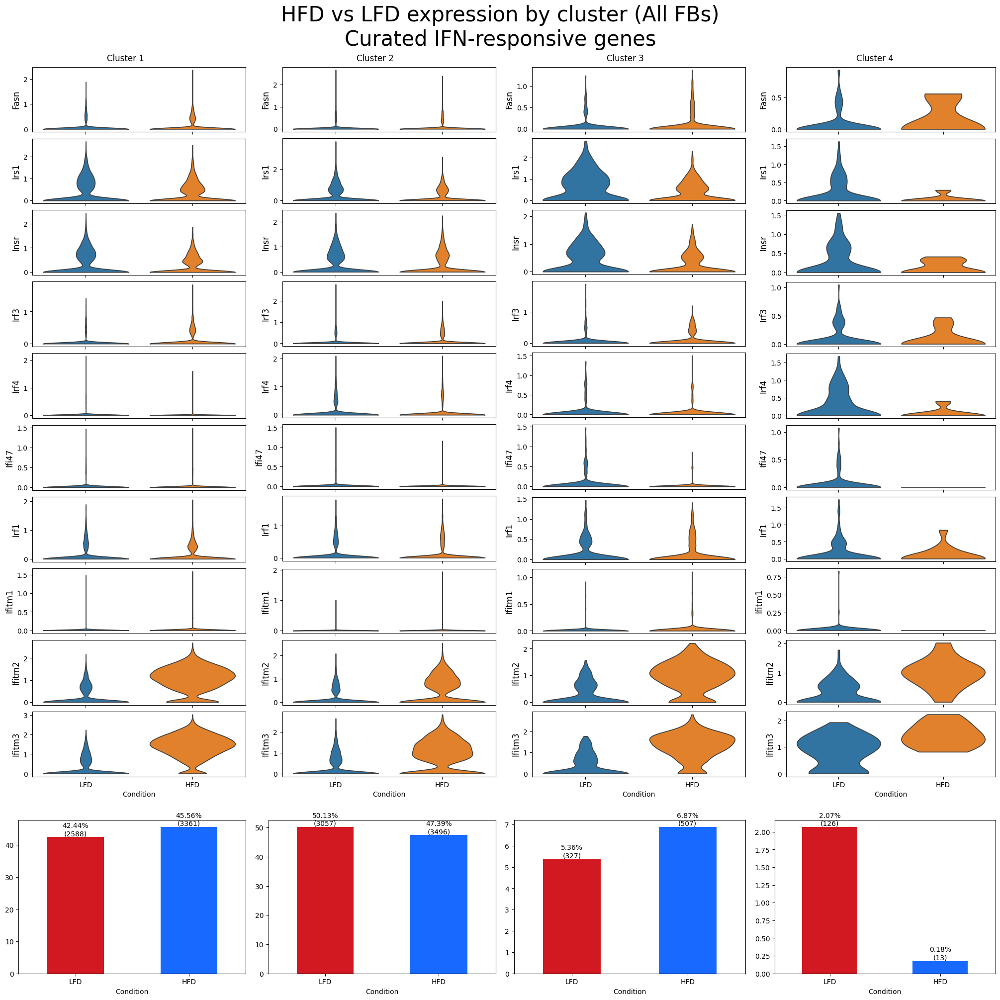

In [8]:
# All FBs
pop_name = "All FBs"

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(
    adata_fibros, "Condition", "leiden_fibro_group", selected_markers, f
)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nSelected markers", fontsize=30
)

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(adata_fibros, "Condition", "leiden_fibro_group", tgfb_genes, f)
f.suptitle(
    f"HFD vs LFD expression by cluster {pop_name})\nCurated TGFβ-responsive genes",
    fontsize=30,
)

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(adata_fibros, "Condition", "leiden_fibro_group", ifn_genes, f)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nCurated IFN-responsive genes",
    fontsize=30,
)

In [ ]:
# eWAT FBs
pop_name = "eWAT FBs"
ewat_fibros = adata_fibros[adata_fibros.obs["Sample Type"] == "eWAT"].copy()
ewat_fibros = ewat_fibros[ewat_fibros.obs["leiden_fibro_group"] != "4"].copy()

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(
    ewat_fibros, "Condition", "leiden_fibro_group", selected_markers, f
)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nSelected markers", fontsize=30
)

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(ewat_fibros, "Condition", "leiden_fibro_group", tgfb_genes, f)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nCurated TGFβ-responsive genes",
    fontsize=30,
)

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(ewat_fibros, "Condition", "leiden_fibro_group", ifn_genes, f)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nCurated IFN-responsive genes",
    fontsize=30,
)

axs = sc.pl.embedding(
    ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=all_fibro_markers + ["leiden_fibro", "leiden_fibro_group", "Condition"],
    ncols=5,
    alpha=0.7,
    show=False,
    color_map=DEFAULT_CMAP,
)
f = axs[0].get_figure()
f.suptitle("Feature plots for all markers (All FBs)", fontsize=30)

# ewat_fibros.obs["Condition-Cluster"] = (ewat_fibros.obs["Condition"].astype(str) + "-Cluster_" + ewat_fibros.obs["leiden_fibro_group"].astype(str)).astype("category")
# order_obs(ewat_fibros, "Condition-Cluster",['LFD-Cluster_1', 'LFD-Cluster_2', 'LFD-Cluster_3',
#                                             'HFD-Cluster_1', 'HFD-Cluster_2', 'HFD-Cluster_3'])

# f = plt.figure(figsize=(10,15),layout="constrained")
# plot_violinplot(ewat_fibros, tgfb_genes, "Condition-Cluster", f, bracket_params={"ratio" : [1,1],
#                                                                                    "labels" : ["LFD", "HFD"],
#                                                                                    "bracket_y" : 0.4,
#                                                                                    "label_y" : 0.65,
#                                                                                    "padding" : 35})
# f.suptitle("HFD vs LFD expression by cluster (TGFβ-response genes)", fontsize=15)

In [ ]:
f = plt.figure(figsize=(15, 5), layout="constrained")
axs = f.subplots(1, 3)
sc.pl.embedding(
    ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=["leiden_fibro"],
    alpha=0.7,
    legend_loc="on data",
    ax=axs[0],
    show=False,
    palette=color_gen(ewat_fibros.obs["leiden_fibro"]).to_list(),
)
sc.pl.embedding(
    ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=["leiden_fibro_group"],
    alpha=0.7,
    legend_loc="on data",
    ax=axs[1],
    show=False,
    palette=color_gen(ewat_fibros.obs["leiden_fibro_group"]).to_list(),
)
sc.pl.embedding(
    ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=["Condition"],
    alpha=0.7,
    ax=axs[2],
    show=False,
)

Text(0.5, 0.98, 'HFD expression of Selected markers')

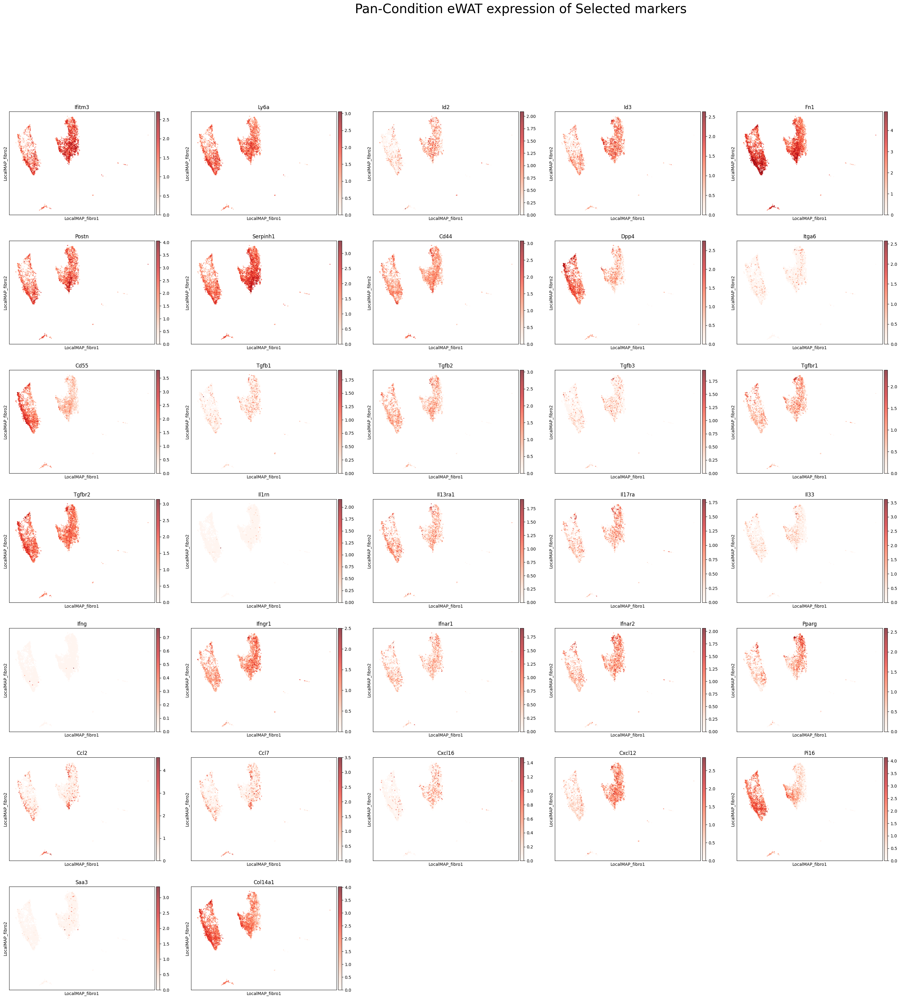

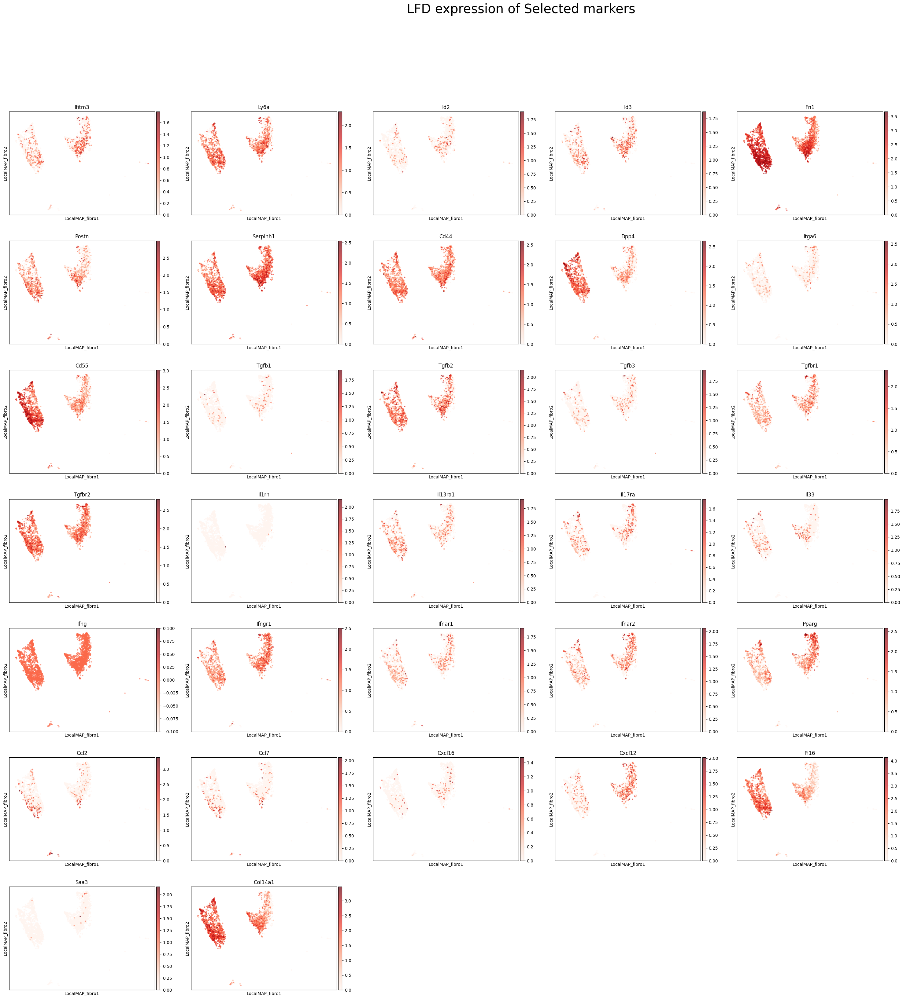

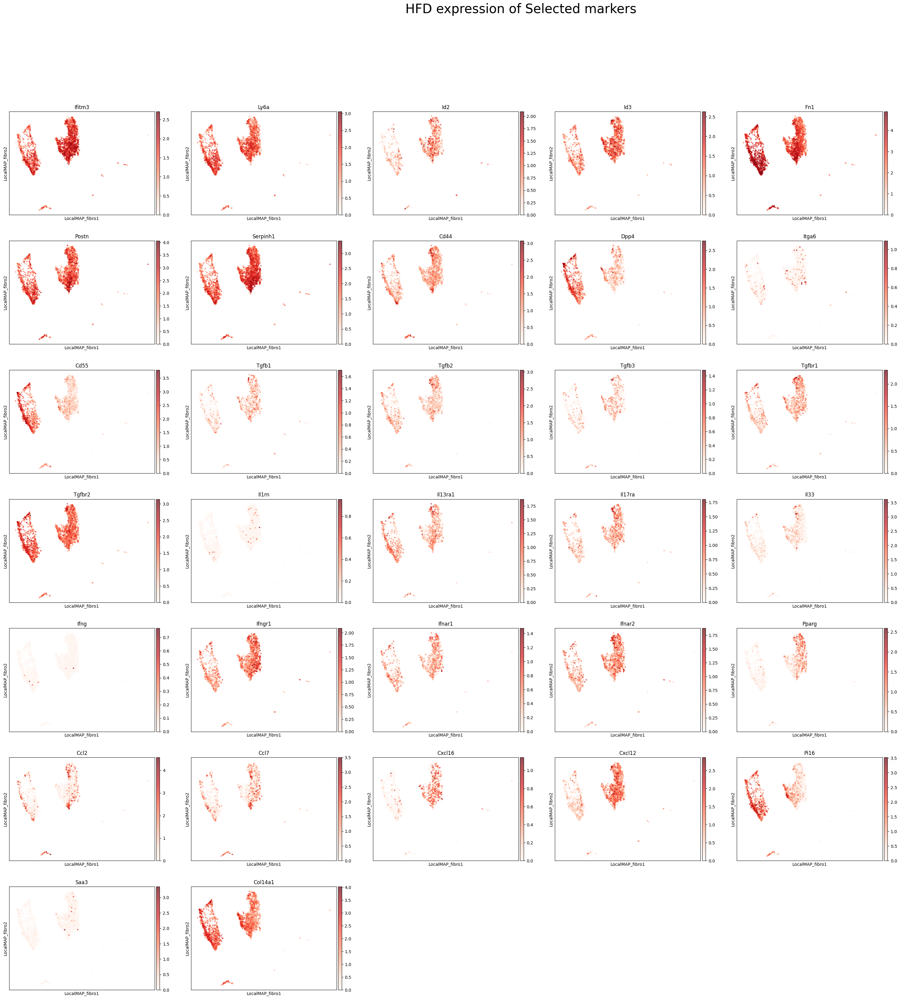

In [9]:
# specified features plots
features_plot = [
    "Ifitm3",
    "Ly6a",
    "Id2",
    "Id3",
    "Fn1",
    "Postn",
    "Serpinh1",
    "Cd44",
    "Dpp4",
    "Itga6",
    "Cd55",
    "Tgfb1",
    "Tgfb2",
    "Tgfb3",
    "Tgfbr1",
    "Tgfbr2",
    "Il1rn",
    "Il13ra1",
    "Il17ra",
    "Il33",
    "Ifng",
    "Ifngr1",
    "Ifnar1",
    "Ifnar2",
    "Pparg",
    "Ccl2",
    "Ccl7",
    "Cxcl16",
    "Cxcl12",
    "Pi16",
    "Saa3",
    "Col14a1",
]

# all eWAT
ax = sc.pl.embedding(
    ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=features_plot,
    ncols=5,
    alpha=0.7,
    color_map="Reds",
    return_fig=True,
    show=False,
)
f = ax.get_figure()
f.suptitle(f"Pan-Condition eWAT expression of Selected markers", fontsize=30)

# LFD
ax = sc.pl.embedding(
    lfd_ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=features_plot,
    ncols=5,
    alpha=0.7,
    color_map="Reds",
    return_fig=True,
    show=False,
)
f = ax.get_figure()
f.suptitle(f"LFD expression of Selected markers", fontsize=30)

# HFD
ax = sc.pl.embedding(
    hfd_ewat_fibros,
    basis="LocalMAP_fibro",
    layer="normalized",
    color=features_plot,
    ncols=5,
    alpha=0.7,
    color_map="Reds",
    return_fig=True,
    show=False,
)
f = ax.get_figure()
f.suptitle(f"HFD expression of Selected markers", fontsize=30)

In [ ]:
# original subclusters
clear_uns(ewat_fibros, "leiden_fibro_group")
sc.tl.rank_genes_groups(
    ewat_fibros,
    groupby="leiden_fibro_group",
    key_added="de_fibro_ewat_clusters",
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    ewat_fibros,
    groupby="leiden_fibro_group",
    key="de_fibro_ewat_clusters",
    standard_scale="var",
    n_genes=40,
    min_logfoldchange=2,
    ax=ax,
)

### ORA Enrichment

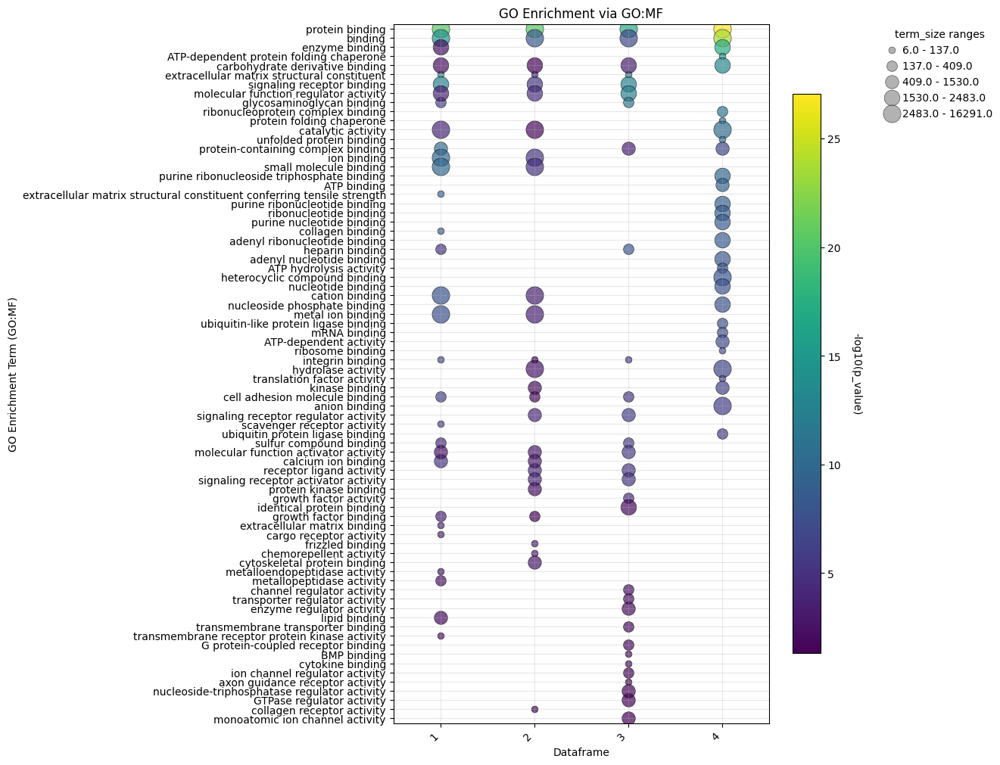

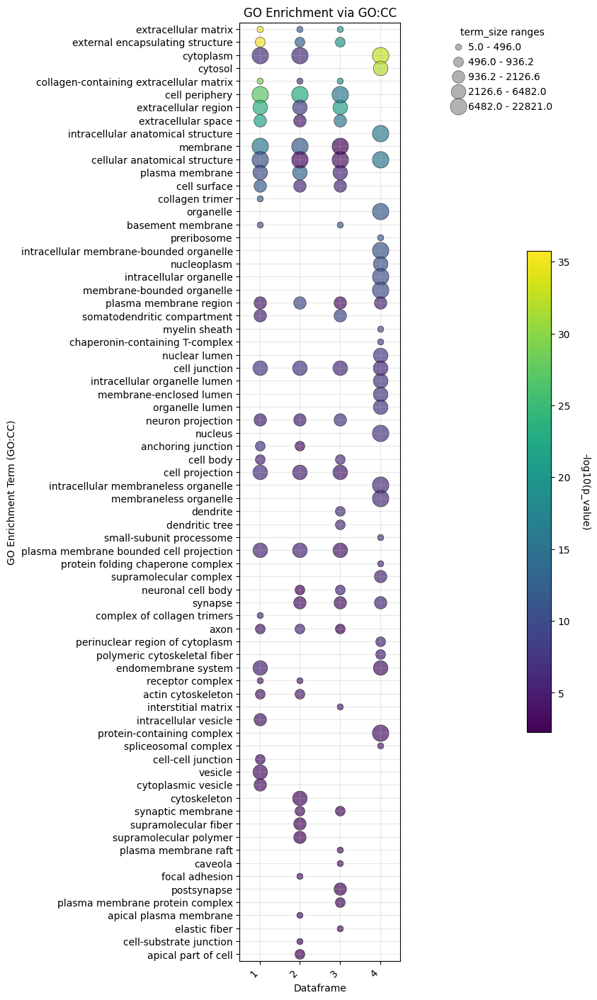

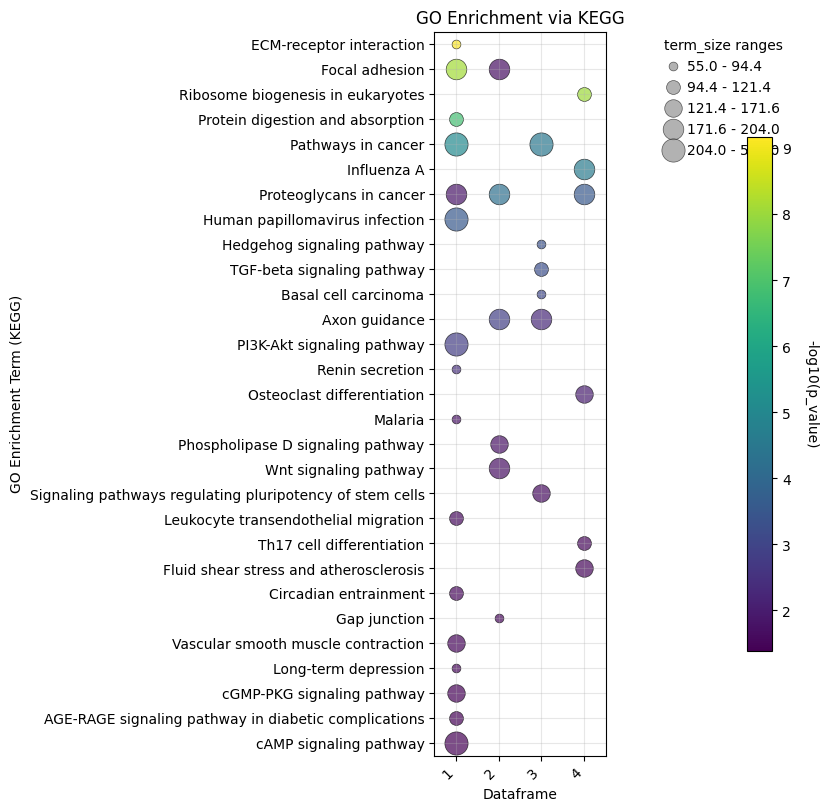

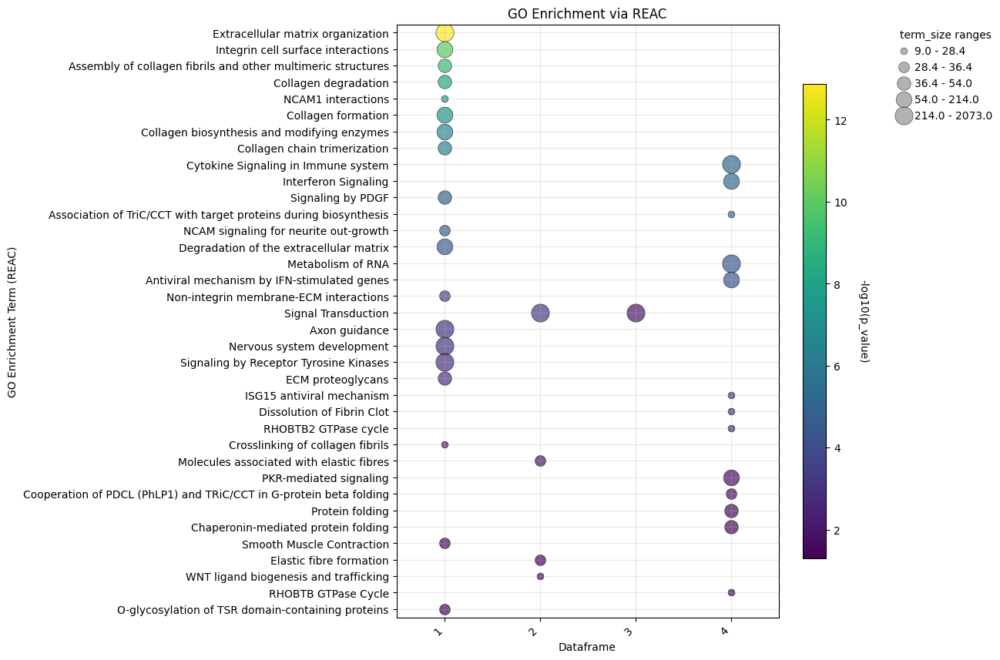

In [12]:
sources = ["GO:MF", "GO:CC", "KEGG", "REAC"]
runGO = False

if runGO is True:
    GOterms = GO_Enrich(
        adata_fibros,
        "leiden_fibro_group",
        "de_fibro",
        sources=sources,
        pval_cutoff=1e-5,
        log2fc_min=1,
    )

figsizes = [(8, 12), (8, 14), (8, 8), (8, 10)]
for n, source in enumerate(sources):
    fig = plot_go_enrichment(
        df_dict=GOterms[source],
        pvalue_col="p_value",
        score_col="term_size",
        pvalue_threshold=0.05,
        rank_by="pvalue",
        top_n=30,
        use_log_pvalue=True,
        use_log_score=False,
        figsize=figsizes[n],
        database=source,
    )

    plt.show()

### GSEA

In [ ]:
ref_dir = os.path.join(REFDIR, "interactome")
hallmark = dc.pp.read_gmt(os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"))

tgfb_genes = hallmark[hallmark.source.isin(["HALLMARK_TGF_BETA_SIGNALING"])].target
tnfa_genes = hallmark[hallmark.source.isin(["HALLMARK_TNFA_SIGNALING_VIA_NFKB"])].target
il_genes = hallmark[
    hallmark.source.isin(
        ["HALLMARK_IL2_STAT5_SIGNALING", "HALLMARK_IL6_JAK_STAT3_SIGNALING"]
    )
].target
ifn_genes = hallmark[
    hallmark.source.isin(
        ["HALLMARK_INTERFERON_ALPHA_RESPONSE", "HALLMARK_INTERFERON_GAMMA_RESPONSE"]
    )
].target
collections = [
    "HALLMARK_TGF_BETA_SIGNALING",
    "HALLMARK_TNFA_SIGNALING_VIA_NFKB",
    "HALLMARK_IL2_STAT5_SIGNALING",
    "HALLMARK_IL6_JAK_STAT3_SIGNALING",
    "HALLMARK_INTERFERON_ALPHA_RESPONSE",
    "HALLMARK_INTERFERON_GAMMA_RESPONSE",
]

pd.Series(gp.get_library_name())

In [79]:
with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
    pickle.dump(cell_gsea_results, handle)

fibroblast:APC & activated
fibroblast:APC & activated (IFN-responsive, SAT)
fibroblast:Lpl+ TGFβ-responsive
fibroblast:Lpl+ collagen producing


Text(0.5, 1.0, 'GSEA by Cluster vs Others')

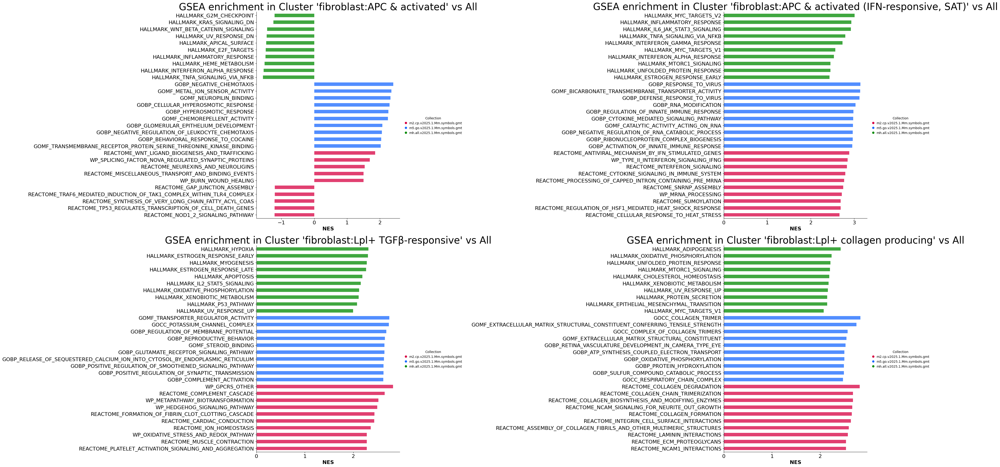

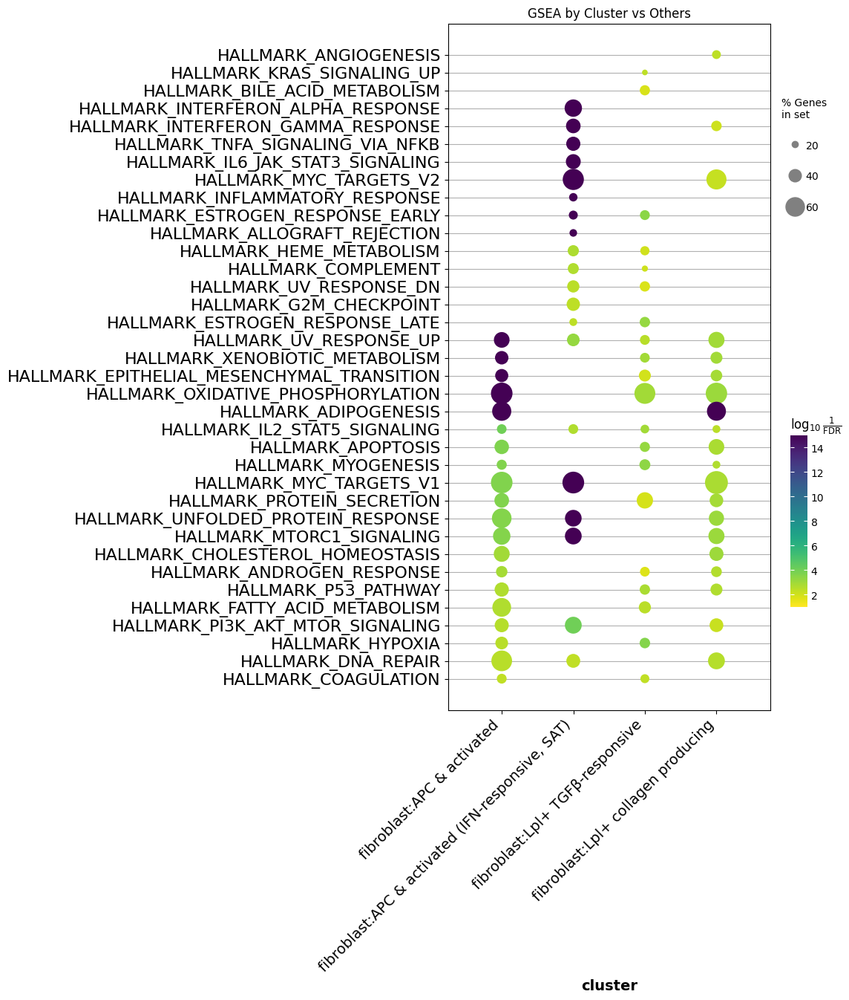

In [ ]:
# GSEApy approach, by cluster
runGSEA = False
method = "gsea"
comparison = "leiden_fibro_FINAL"
collection_query = "mh"

annotation = "manDoublet-seuratV3-harmony-annotated-fibro - GSEA by cluster"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = GSEA_gseapy(
        adata_fibros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)


collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(2, 2, figsize=(40, 20), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    gp.plot.barplot(
        cell_gsea_results[cluster][cell_gsea_results[cluster]["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(f"GSEA enrichment in Cluster '{cluster}' vs All", size=30)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(7, 12), layout="constrained")
gp.plot.dotplot(results_grouped, "FDR q-val", x="cluster", ax=ax, top_term=20)
plt.xticks(rotation=45, ha="right")
plt.title("GSEA by Cluster vs Others")

fibroblast:APC & activated
fibroblast:APC & activated (IFN-responsive, SAT)
fibroblast:Lpl+ TGFβ-responsive
fibroblast:Lpl+ collagen producing


Text(0.5, 1.0, 'HFD GSEA by Cluster')

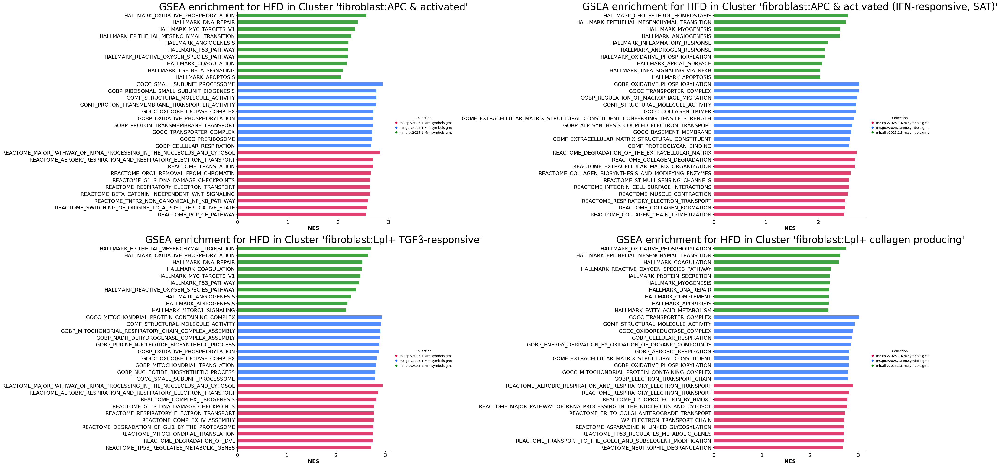

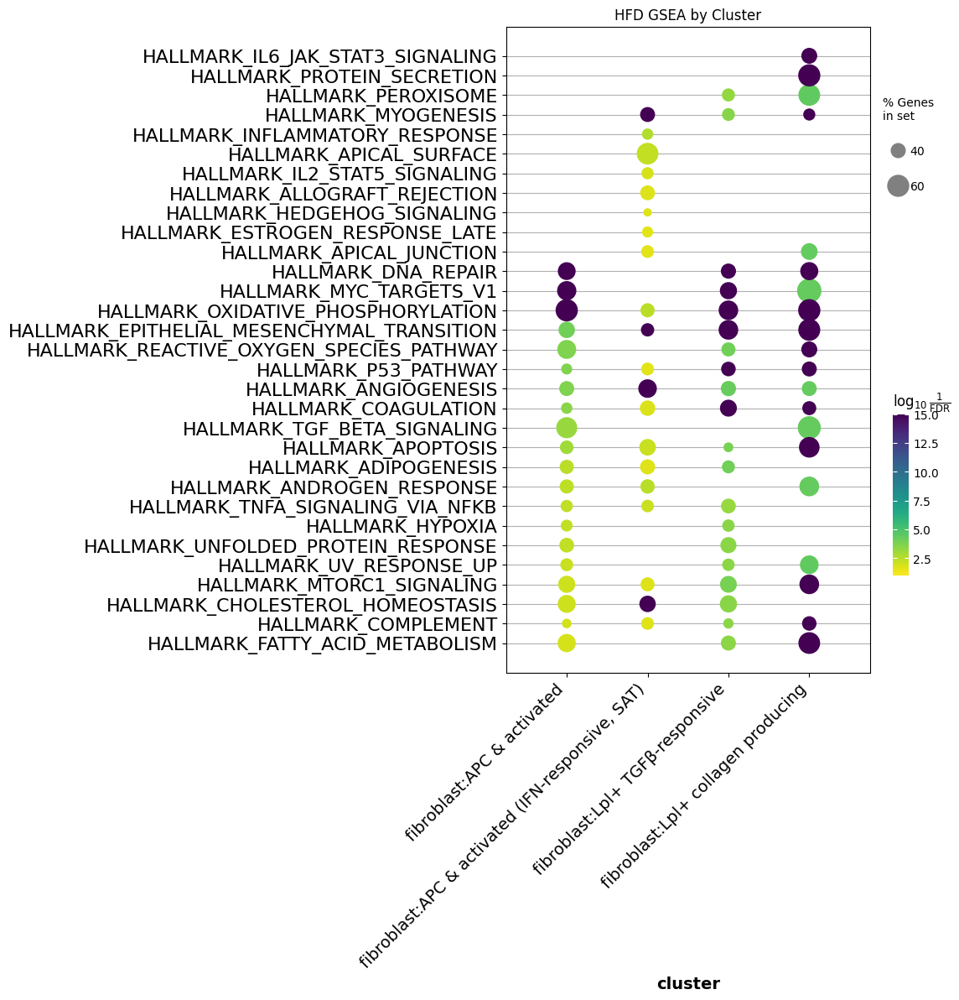

In [109]:
# GSEApy approach, by cluster
runGSEA = False
method = "gsea"
cluster_key = "leiden_fibro_FINAL"
comparison = "Condition"
collection_query = "mh"

annotation = (
    "manDoublet-seuratV3-harmony-annotated-fibro - GSEA for condition by cluster"
)
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MACRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = {}
    for cluster in adata_fibros.obs[cluster_key].unique():
        tmp = adata_fibros[adata_fibros.obs[cluster_key] == cluster]
        cell_gsea_results[cluster] = GSEA_gseapy(
            tmp,
            genesets=[dataset for dataset in gsea_sets.values()],
            method=method,
            groupby=comparison,
            permutation_num=500,
        )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)

collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(2, 2, figsize=(40, 20), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    gp.plot.barplot(
        tmp[tmp["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(f"GSEA enrichment for HFD in Cluster '{cluster}'", size=30)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(7, 10), layout="constrained")
gp.plot.dotplot(results_grouped, "FDR q-val", x="cluster", ax=ax, top_term=20)
plt.xticks(rotation=45, ha="right")
plt.title("HFD GSEA by Cluster")

In [ ]:
cluster = "1"
condition = "HFD"
gs_res = clust_cond_gsea_results[str(cluster)][condition]

for coll in collections:
    tmp = gs_res[gs_res["Term"].isin([coll])]
    lead_genes = tmp["Lead_genes"].str.split(";", expand=True)
    lead_genes = pd.Series(lead_genes.to_numpy().flatten()).dropna().unique()
    f = sc.pl.embedding(
        ewat_fibros, basis="LocalMAP_fibro", color=lead_genes, ncols=8, return_fig=True
    )
    f.suptitle(
        f"{coll} Lead Genes ($ES={float(tmp["NES"]):.2f}, FDR={float(tmp["FDR q-val"]):.2f}$)",
        size=40,
    )

In [ ]:
# Decoupler method
run_GSEA = True

# get geneset info
gsea_sets = {
    "FIBRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "FIBRO_MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "FIBRO_MSigDB-M3" : os.path.join(ref_dir,"m3.all.v2025.1.Mm.symbols.gmt"),
    "FIBRO_MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    "FIBRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "FIBRO_MSigDB-M8" : os.path.join(ref_dir,"m8.all.v2025.1.Mm.symbols.gmt"),
    "FIBRO_CollecTRI": dc.op.collectri(organism="mouse"),
}

# run GSEA
if run_GSEA is True:
    for name, geneset in gsea_sets.items():
        if type(geneset) is str:
            GSEA_decoupler(
                ewat_fibros, name, type="ULM", geneset_dir=geneset, remove_prefix=False
            )
        else:
            GSEA_decoupler(ewat_fibros, name, type="ULM", geneset=geneset)

# plot
f = plt.figure(figsize=(len(gsea_sets) * 8, 10), layout="constrained")
sf = f.subfigures(1, len(gsea_sets))
for name in gsea_sets.keys():
    clear_uns(ewat_fibros, "dendrogram")
    clear_uns(ewat_fibros, "colors")
    plot_gsea_dc(
        ewat_fibros,
        f"GSEA ({name})",
        f"{name}_score_ulm",
        "leiden_fibro_group",
        30,
        name,
    )

#### Look at one geneset

In [ ]:
gsea_sets_2 = {
    "FIBRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt")
}
for name, geneset in gsea_sets_2.items():
    GSEA_decoupler(
        ewat_fibros, name, type="AUCell", geneset_dir=geneset, remove_prefix=False
    )

In [ ]:
score = dc.pp.get_obsm(adata=ewat_fibros, key="FIBRO_MSigDB-MH_score_aucell")
f = plt.figure(figsize=(len(collections) * 5, 10), layout="constrained")
ax = f.subplots(2, len(collections)).flatten()

for i, cond in enumerate(score.obs["Condition"].unique()):
    tmp = score[score.obs["Condition"] == cond]
    for j, coll in enumerate(collections):
        sc.pl.embedding(
            tmp,
            basis="LocalMAP_fibro",
            color=coll,
            title=f"{coll}\n({cond} eWAT)",
            vmax=np.max(score[:, coll].X),
            ax=ax[i * len(collections) + j],
            show=False,
        )

# Subcluster Decisions

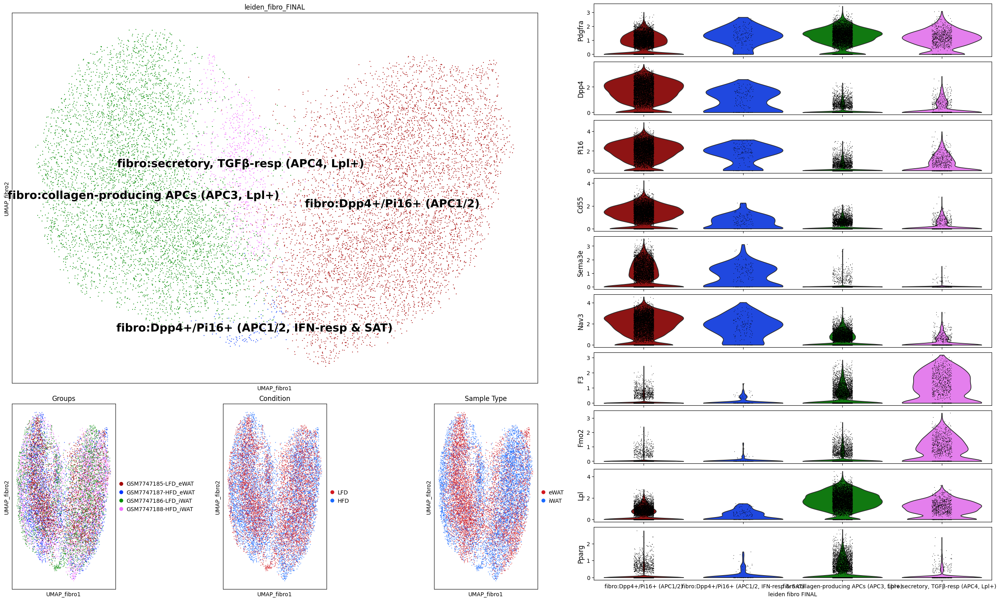

In [ ]:
cluster_key = "leiden_fibro_FINAL"
old_cluster_key = "leiden_fibro_group"
embedding = "UMAP_fibro"  # "LocalMAP_fibro

adata_fibros.obs[cluster_key] = (
    adata_fibros.obs[old_cluster_key]
    .map(
        {
            "1": "fibro:collagen-producing APCs (APC3, Lpl+)",
            "3": "fibro:secretory, TGFβ-resp (APC4, Lpl+)",
            "2": "fibro:Dpp4+/Pi16+ (APC1/2)",
            "4": "fibro:Dpp4+/Pi16+ (APC1/2, IFN-resp & SAT)",
        }
    )
    .astype(str)
)

# figure prep
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1.5])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=[cluster_key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=color_gen(adata_fibros.obs[cluster_key]).to_list(),
),
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=["Groups"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_fibros.obs["Groups"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_fibros.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_fibros,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_fibros.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = [
    "Pdgfra",
    "Dpp4",
    "Pi16",
    "Cd55",
    "Sema3e",
    "Nav3",
    "F3",
    "Fmo2",
    "Lpl",
    "Pparg",
]
plot_violinplot(adata_fibros, markers, cluster_key, sf[1])
plot_cluster_barplots(adata_fibros, "Condition", cluster_key, f)

dendrogram data not found (using key=dendrogram_leiden_fibro_FINAL). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


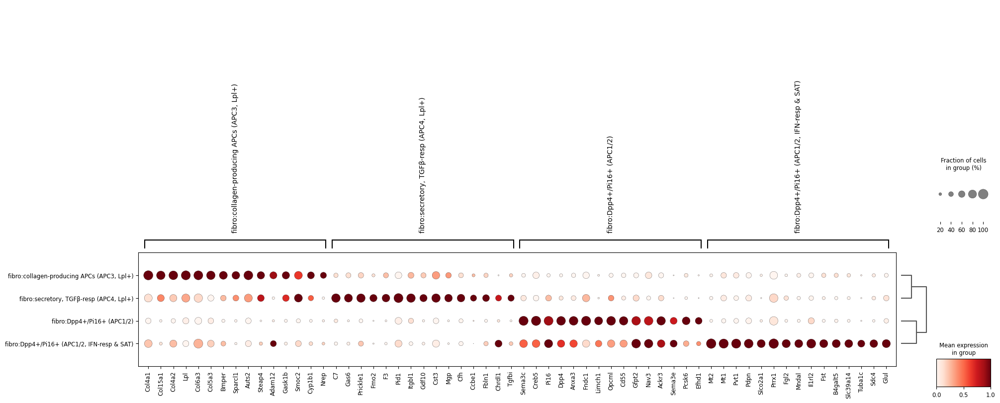

Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


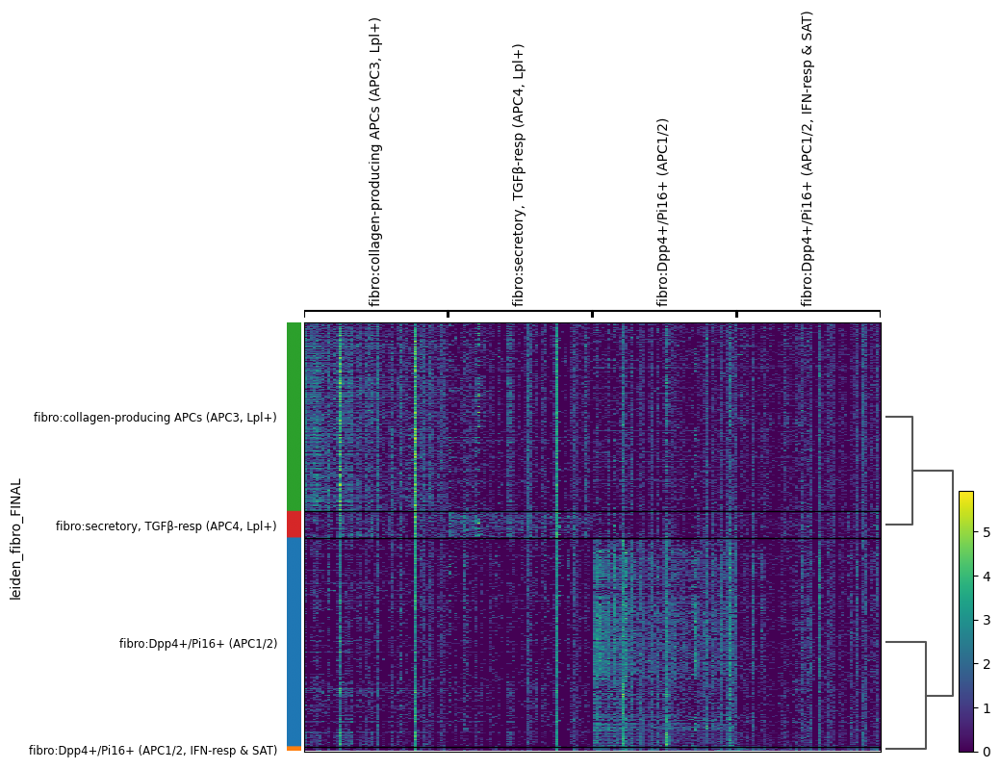

In [11]:
group_key = "leiden_fibro_FINAL"
de_key = "de_fibro_FINAL"
runDEGs = True

# clean metadata
clear_uns(adata_fibros, group_key)

if runDEGs is True:
    # run DEGs
    sc.tl.rank_genes_groups(
        adata_fibros,
        groupby=group_key,
        key_added=de_key,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(20, 8), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_fibros,
    groupby=group_key,
    key=de_key,
    standard_scale="var",
    n_genes=15,
    min_logfoldchange=2,
    ax=ax,
)

# plot DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_fibros, key=de_key, groupby=group_key, layer="normalized", n_genes=50
)

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [07:44<00:00, 116.24s/it]


fibro:Dpp4+/Pi16+ (APC1/2)
fibro:Dpp4+/Pi16+ (APC1/2, IFN-resp & SAT)
fibro:collagen-producing APCs (APC3, Lpl+)
fibro:secretory, TGFβ-resp (APC4, Lpl+)


Text(0.5, 1.0, 'GSEA by Cluster vs Others (top 50 each)')

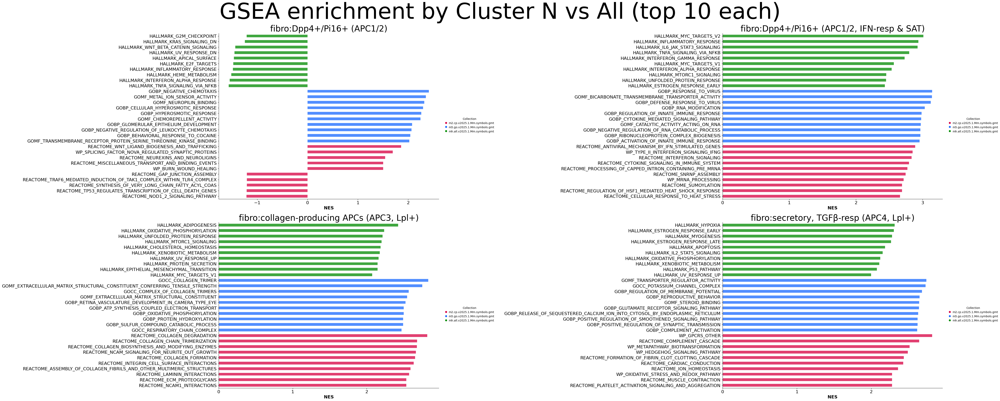

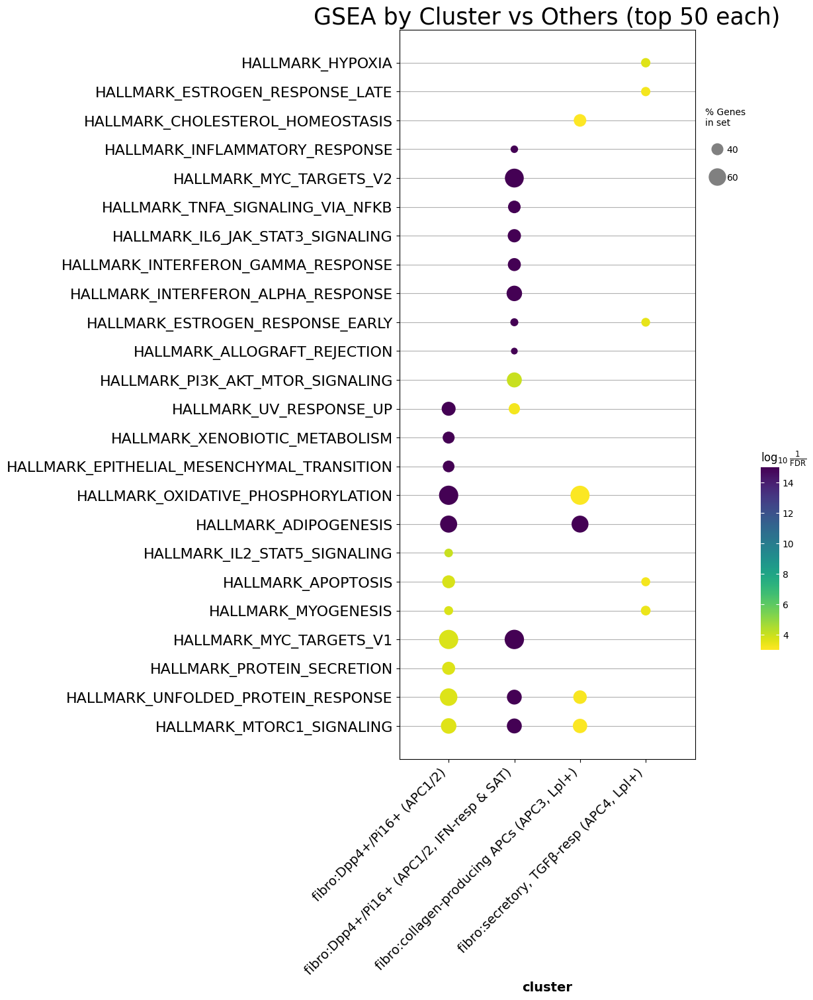

In [ ]:
# GSEApy approach, by cluster
runGSEA = False
method = "gsea"
comparison = "leiden_fibro_FINAL"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 2
assert ncol * nrow >= len(adata_fibros.obs[comparison].cat.categories)

annotation = "manDoublet-seuratV3-harmony-annotated-fibro - GSEA by cluster"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = GSEA_gseapy(
        adata_fibros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)


collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    gp.plot.barplot(
        cell_gsea_results[cluster][cell_gsea_results[cluster]["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment by Cluster N vs All (top 10 each)", size=80)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(12, 15), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
)
plt.xticks(rotation=45, ha="right")
plt.title(f"GSEA by Cluster vs Others (top {top_n} each)", size=25)

100%|██████████| 2/2 [04:09<00:00, 124.65s/it]


ALL
fibro:Dpp4+/Pi16+ (APC1/2)
fibro:Dpp4+/Pi16+ (APC1/2, IFN-resp & SAT)
fibro:collagen-producing APCs (APC3, Lpl+)
fibro:secretory, TGFβ-resp (APC4, Lpl+)


Text(0.5, 1.0, 'HFD GSEA by Cluster (top 50 each)')

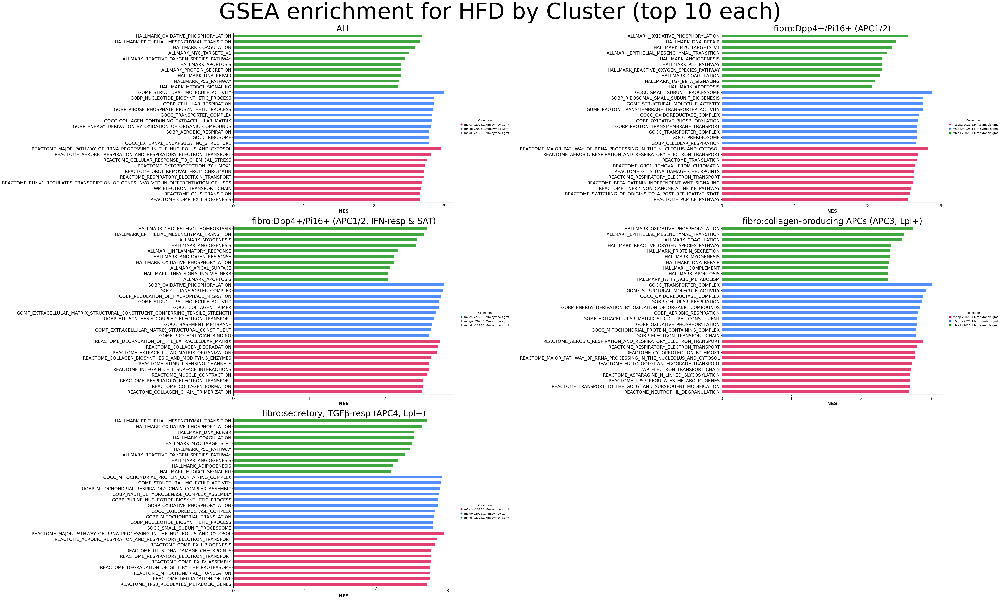

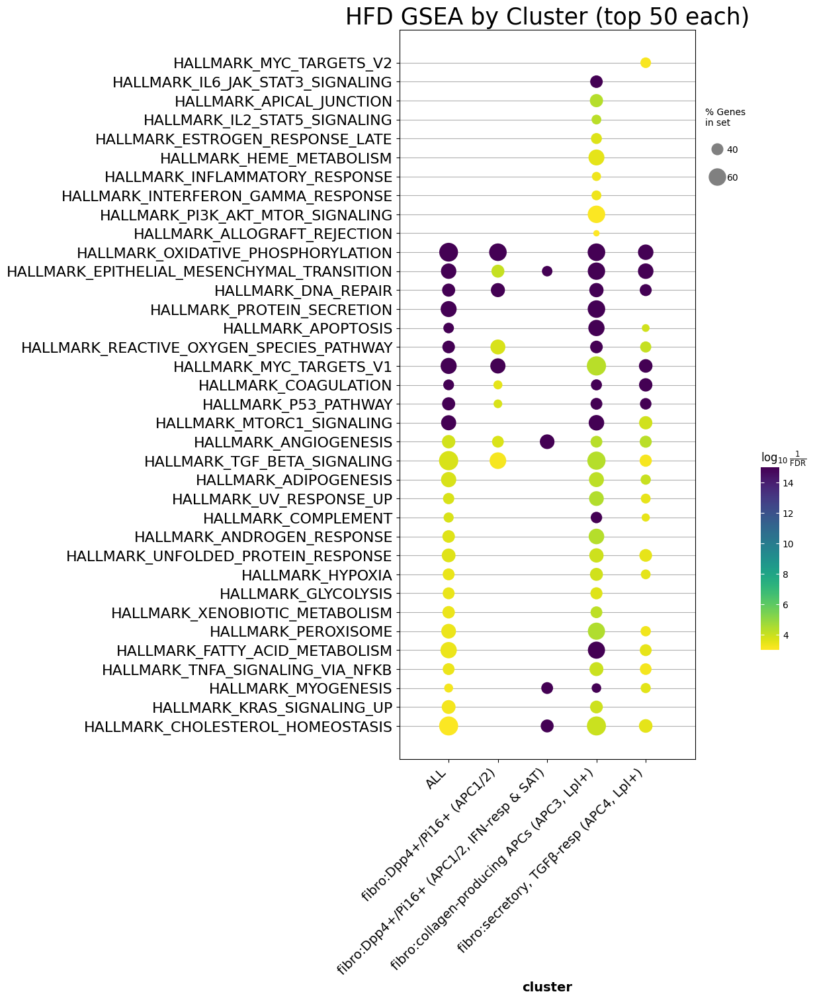

In [13]:
# GSEApy approach, condition by cluster
runGSEA = False
method = "gsea"
cluster_key = "leiden_fibro_FINAL"
comparison = "Condition"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 3
assert ncol * nrow >= len(adata_fibros.obs[comparison].cat.categories) + 1

annotation = (
    "manDoublet-seuratV3-harmony-annotated-fibro - GSEA for condition by cluster"
)
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MACRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = {}
    for cluster in adata_fibros.obs[cluster_key].unique():
        tmp = adata_fibros[adata_fibros.obs[cluster_key] == cluster]
        cell_gsea_results[cluster] = GSEA_gseapy(
            tmp,
            genesets=[dataset for dataset in gsea_sets.values()],
            method=method,
            groupby=comparison,
            permutation_num=500,
        )

    cell_gsea_results["ALL"] = GSEA_gseapy(
        adata_fibros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )

    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)

collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    gp.plot.barplot(
        tmp[tmp["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment for HFD by Cluster (top 10 each)", size=80)
ax[-1].remove()

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(12, 15), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
    x_order=["ALL"]
    + adata_fibros.obs[cluster_key].cat.categories.sort_values().to_list(),
)
plt.xticks(rotation=45, ha="right")
plt.title(f"HFD GSEA by Cluster (top {top_n} each)", size=25)

# Save/Load

In [14]:
# save
annotation = "manDoublet-seuratV3-harmony-annotated-fibro"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
os.makedirs(savedir, exist_ok=True)
adata_fibros.write(os.path.join(savedir, f"{annotation}.h5ad"))

In [3]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated-fibro"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
adata_fibros = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# # relevant subsets
# ewat_fibros = adata_fibros[adata_fibros.obs["Sample Type"] == "eWAT"].copy()
# ewat_fibros = ewat_fibros[ewat_fibros.obs["leiden_fibro_group"] != "4"].copy()
# lfd_ewat_fibros = ewat_fibros[ewat_fibros.obs["Condition"] == "LFD"].copy()
# hfd_ewat_fibros = ewat_fibros[ewat_fibros.obs["Condition"] == "HFD"].copy()

# Exploration Zone

### Pdgrfb+ perivascular FBs & Nr4a go up in HFD (cluster 1/3)

https://elifesciences.org/articles/39636#s3
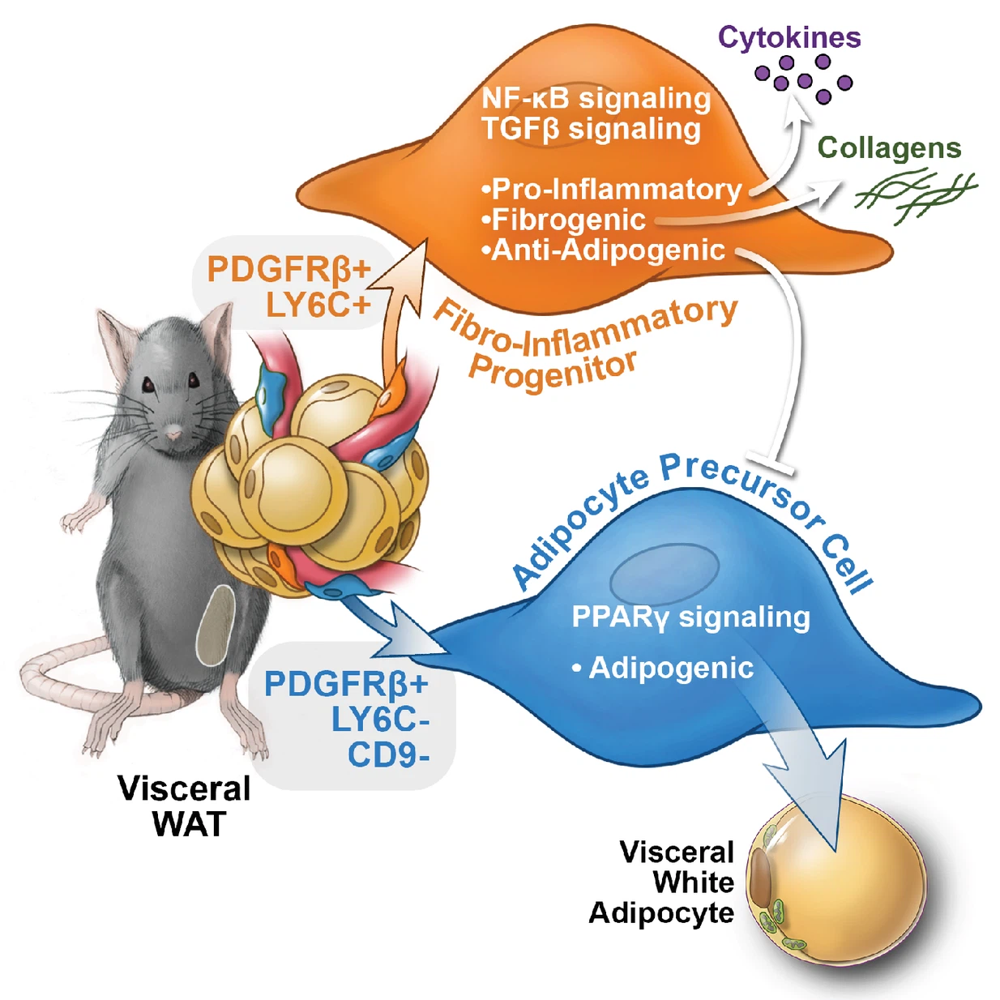

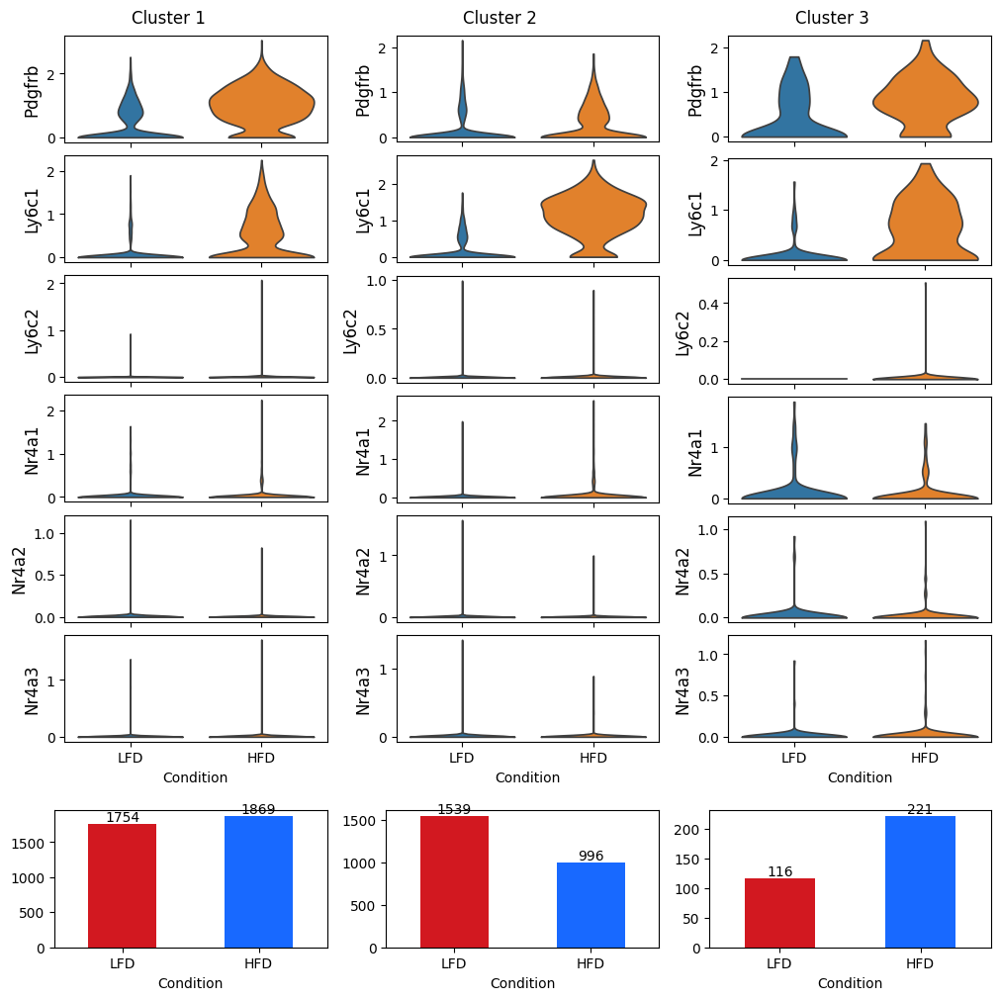

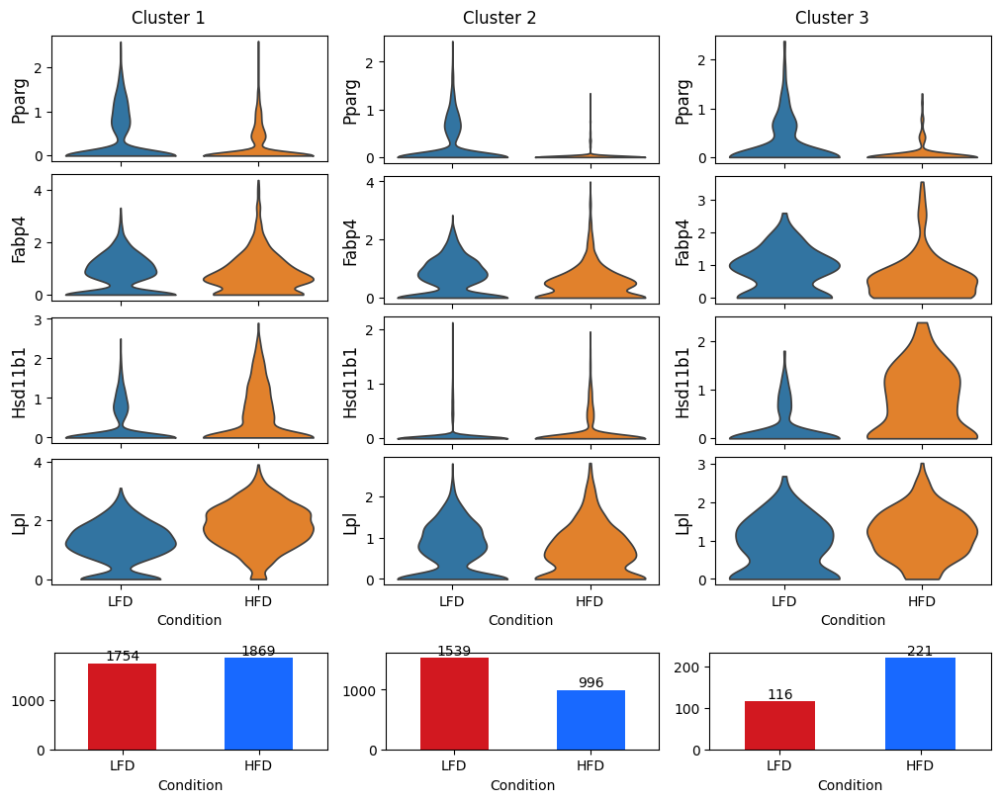

In [26]:
markers = ["Pdgfrb", "Ly6c1", "Ly6c2", "Nr4a1", "Nr4a2", "Nr4a3"]
f = plt.figure(figsize=(10, 10), layout="constrained")
plot_cluster_violinplot(
    ewat_fibros,
    "Condition",
    "leiden_fibro_group",
    markers=markers,
    f=f,
)

markers = ["Pparg", "Fabp4", "Hsd11b1", "Lpl"]
f = plt.figure(figsize=(10, 8), layout="constrained")
plot_cluster_violinplot(
    ewat_fibros,
    "Condition",
    "leiden_fibro_group",
    markers=markers,
    f=f,
)

## Carlos cytokine cesponse signatures

In [ ]:
filename = os.path.join(REFDIR, "Carlos_DEseq2_data.xlsx")
exposures = pd.ExcelFile(filename).sheet_names
bulkseqs = [
    pd.read_excel(filename, sheet_name=sheet, usecols=np.arange(7), nrows=2000)
    for sheet in exposures
]
bulkseqs[0][(bulkseqs[0]["P.adj"] > 1e-5) & (bulkseqs[0]["Log2.FC."] > 1)]

In [ ]:
pval_cutoff = 1e-5
log2fc_cutoff = 1

up_signatures = dict(
    zip(
        [f"{i}_UP" for i in exposures],
        [
            data[(data["P.adj"] < pval_cutoff) & (data["Log2.FC."] > log2fc_cutoff)]
            for data in bulkseqs
        ],
    )
)
dn_signatures = dict(
    zip(
        [f"{i}_DOWN" for i in exposures],
        [
            data[(data["P.adj"] < pval_cutoff) & (data["Log2.FC."] < -log2fc_cutoff)]
            for data in bulkseqs
        ],
    )
)
signatures = up_signatures | dn_signatures

pd.DataFrame([(i[0], i[1].shape[0]) for i in signatures.items()])

In [ ]:
groups = [name for name in signatures.keys()]
ends = [0]
brackets = []
gene_names = []
for key, sig in signatures.items():
    sig_genes = sig.iloc[:, 0]
    sig_genes = sig_genes[sig_genes.isin(adata_fibros.var_names)]

    ends.append(len(sig_genes))
    gene_names.append(sig_genes)

brackets = [(np.cumsum(ends)[i], np.cumsum(ends)[i + 1]) for i in range(len(ends) - 1)]
gene_names = pd.concat(gene_names)
sc.pl.heatmap(
    adata_fibros,
    gene_names,
    groupby="leiden_fibro_group",
    var_group_positions=brackets,
    var_group_labels=groups,
    layer="normalized",
    use_raw=False,
    vmax=3,
)

adata_fibros[:, gene_names].var.nlargest(10, "means")

In [ ]:
from scipy.sparse._csr import csr_matrix

ewat_fibros.obs["Condition-Cluster"] = (
    ewat_fibros.obs["Condition"].astype(str)
    + "-Fibro_"
    + ewat_fibros.obs["leiden_fibro_group"].astype(str)
).astype("category")


def find_var_means(adata, groupby, layer="normalized"):
    arr = adata.layers[layer]
    if type(arr) is csr_matrix:
        arr = arr.toarray()

    tmp = pd.concat(
        (
            pd.DataFrame(arr, columns=adata.var_names).reset_index(drop=True),
            adata.obs[groupby].reset_index(drop=True),
        ),
        axis=1,
    )

    dfs = [
        (name, np.mean(df.iloc[:, :-1], axis=0)) for name, df in tmp.groupby(groupby)
    ]
    tmp = pd.concat([df[1] for df in dfs], axis=1)
    tmp.columns = [df[0] for df in dfs]
    return tmp


means = find_var_means(ewat_fibros, "Condition-Cluster")

tmp_adata = sc.AnnData(X=means.loc[gene_names.unique()].T)
tmp_adata.obs["Name"] = tmp_adata.obs_names

boundaries = [0]
gene_names_ordered = []
brackets = []
for name, sig in signatures.items():
    genes = sig.iloc[:, 0][sig.iloc[:, 0].isin(tmp_adata.var_names)]
    order = scipy.cluster.hierarchy.linkage(
        tmp_adata[:, genes].X.T, optimal_ordering=True
    )
    order = scipy.cluster.hierarchy.dendrogram(order)["leaves"]
    genes_to_plot = sig.iloc[order].iloc[:, 0]
    genes_to_plot = genes_to_plot[genes_to_plot.isin(tmp_adata.var_names)]
    gene_names_ordered += genes_to_plot.tolist()
    boundaries.append(len(gene_names_ordered))
    brackets.append((boundaries[-2], boundaries[-1]))

In [ ]:
ax = sc.pl.heatmap(
    tmp_adata,
    gene_names_ordered,
    groupby="Name",
    var_group_positions=brackets,
    var_group_labels=groups,
    vmax=3,
    figsize=(100, 10),
    show_gene_labels=True,
)

In [ ]:
def GSEA_decoupler(
    adata,
    name: str,
    type: str = "ULM",
    geneset_dir: str = None,
    geneset=None,
):
    if geneset is None:
        assert geneset_dir is not None
        geneset = dc.pp.read_gmt(geneset_dir)

    if type == "ULM":
        dc.mt.ulm(data=adata, net=geneset, layer="normalized", verbose=True)
        adata.obsm[f"{name}_score_ulm"] = adata.obsm["score_ulm"]
        adata.obsm[f"{name}_padj_ulm"] = adata.obsm["padj_ulm"]
        del adata.obsm["score_ulm"], adata.obsm["padj_ulm"]

    elif type == "GSEA":
        dc.mt.gsea(data=adata, net=geneset, layer="normalized", verbose=True)
        adata.obsm[f"{name}_score_gsea"] = adata.obsm["score_gsea"]
        adata.obsm[f"{name}_padj_gsea"] = adata.obsm["padj_gsea"]
        del adata.obsm["score_gsea"], adata.obsm["padj_gsea"]

    elif type == "AUCell":
        dc.mt.aucell(data=adata, net=geneset, layer="normalized", verbose=True)
        adata.obsm[f"{name}_score_aucell"] = adata.obsm["score_aucell"]
        del adata.obsm["score_aucell"]

    return adata


curated_geneset = []
for name, genes in signatures.items():
    df = genes.copy()
    df["target"] = df["Unnamed: 0"]
    df["source"] = name
    curated_geneset.append(df[["source", "target"]])

curated_geneset = pd.concat(curated_geneset)

name = "Cytokine Response (Carlos DESeq)"
GSEA_decoupler(ewat_fibros, name, geneset=curated_geneset)
GSEA_decoupler(ewat_fibros, name, geneset=curated_geneset, type="AUCell")

In [ ]:
# adata_fibros.obs["Condition-Cluster"] = (adata_fibros.obs["Condition"].astype(str) + "-Fibro_" + adata_fibros.obs["leiden_fibro_group"].astype(str)).astype('category')

score_obj = dc.pp.get_obsm(adata=ewat_fibros, key=f"{name}_score_ulm")
tmp = pd.concat(
    (
        pd.DataFrame(score_obj.X, columns=score_obj.var_names).reset_index(drop=True),
        score_obj.obs["Condition-Cluster"].reset_index(drop=True),
    ),
    axis=1,
)

dfs = [
    (name, np.mean(df.iloc[:, :-1], axis=0))
    for name, df in tmp.groupby("Condition-Cluster")
]
tmp = pd.concat([df[1] for df in dfs], axis=1)
tmp.columns = [df[0] for df in dfs]
cs = len(score_obj.obs["Condition-Cluster"].cat.categories) // 2

diff = pd.DataFrame(
    tmp.iloc[:, :cs].values - tmp.iloc[:, cs:].values,
    columns=tmp.columns[:cs].str.replace("HFD-", ""),
    index=tmp.index,
)
sns.heatmap(diff, annot=True)
plt.title("diff in means btwn HFD - LFD enrichment")

In [ ]:
def plot_gsea(adata, name, key="score_ulm", group="cell_type", n_markers=5, flip=True):
    score = dc.pp.get_obsm(adata=adata, key=key)
    df = dc.tl.rankby_group(
        adata=score, groupby=group, reference="rest", method="wilcoxon"
    )
    df = df[df["stat"] > 0]

    source_markers = (
        df.groupby("group")
        .head(n_markers)
        .drop_duplicates("name")
        .groupby("group")["name"]
        .apply(lambda x: list(x))
        .to_dict()
    )

    del score.uns

    sc.pl.matrixplot(
        adata=score,
        var_names=source_markers,
        groupby=group,
        dendrogram=False,
        # standard_scale="var",
        # colorbar_title="Z-scaled scores",
        cmap="Reds",
        swap_axes=flip,
        title=name,
    )

    return score


ulm_score = plot_gsea(
    ewat_fibros,
    f"GSEA ({name} - ULM model)",
    f"{name}_score_ulm",
    "Condition-Cluster",
    10,
    name,
)
aucell_score = plot_gsea(
    ewat_fibros,
    f"GSEA ({name} - AUCell model)",
    f"{name}_score_aucell",
    "Condition-Cluster",
    10,
    name,
)